In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats

%matplotlib inline

In [2]:
data = pd.read_csv('stores_1_to_10.csv')
data.head()

,Store,Date,IsHoliday,Temperature,gas_price,discount_promotional,discount_clearance,discount_damaged_good,discount_competitive,CPI,Unemployment,Weekly_Sales,Type,Size,Weekly_Sales.1
0,1,2/5/2010,False,59.33,3.360,9667.50,268.29,0.60,8368.15,223.659114,6.833,1643690.90,A,151315,1643690.90
1,1,2/12/2010,True,51.65,3.409,8687.47,1594.87,2.20,2144.87,223.753643,6.833,1641957.44,A,151315,1641957.44
2,1,2/19/2010,False,52.39,3.510,2706.87,3128.74,1.88,2396.68,223.917015,6.833,1611968.17,A,151315,1611968.17
3,1,3/12/2010,False,60.71,3.669,8368.50,298.46,1.39,1340.29,224.562029,6.833,1439541.59,A,151315,1439541.59
4,1,3/19/2010,False,64.00,3.734,2588.06,80.89,3.20,909.76,224.716695,6.833,1472515.79,A,151315,1472515.79


In [3]:
data.shape

(389, 15)

In [4]:
data.describe()

,Store,Temperature,gas_price,discount_promotional,discount_clearance,discount_damaged_good,discount_competitive,CPI,Unemployment,Weekly_Sales,Size,Weekly_Sales.1
count,389.000000,389.000000,389.000000,389.000000,389.000000,389.000000,389.000000,389.000000,389.000000,3.890000e+02,389.000000,3.890000e+02
mean,4.861183,63.521440,3.492257,7293.894139,3188.332956,1572.275501,3095.370206,203.615421,6.507838,1.180222e+06,139937.177378,1.329770e+06
std,2.990752,17.394233,0.254833,8055.708978,10551.425971,10988.478784,5524.827030,35.679061,1.126070,4.937040e+05,58557.107283,6.739780e+05
min,1.000000,7.460000,3.031000,35.940000,-10.980000,0.010000,5.940000,129.816710,4.077000,3.300631e+05,34875.000000,2.914545e+05
25%,2.000000,50.640000,3.290000,2706.870000,27.000000,3.000000,439.970000,197.929038,5.679000,7.530608e+05,125833.000000,6.097361e+05
50%,5.000000,63.890000,3.479000,5359.220000,139.930000,16.500000,1319.450000,221.747214,6.334000,1.237105e+06,151315.000000,1.497955e+06
75%,7.000000,80.170000,3.669000,8813.810000,1555.570000,93.060000,3463.030000,224.056008,7.441000,1.542720e+06,202307.000000,1.830075e+06
max,10.000000,90.230000,4.301000,75149.790000,104519.540000,141630.610000,48159.860000,228.729864,8.513000,3.676389e+06,205863.000000,3.676389e+06


In [5]:
data.duplicated().sum()

0

In [6]:
#Find null values
data.isnull().sum()

Store                    0
Date                     0
IsHoliday                0
Temperature              0
gas_price                0
discount_promotional     0
discount_clearance       0
discount_damaged_good    0
discount_competitive     0
CPI                      0
Unemployment             0
Weekly_Sales             0
Type                     0
Size                     0
Weekly_Sales.1           0
dtype: int64

In [7]:
#remove missing values 
data = data.dropna()
data
#Replace null values
#data.replace(np.nan,'0',inplace = True)
#Check the changes now
#data.isnull().sum()

,Store,Date,IsHoliday,Temperature,gas_price,discount_promotional,discount_clearance,discount_damaged_good,discount_competitive,CPI,Unemployment,Weekly_Sales,Type,Size,Weekly_Sales.1
0,1,2/5/2010,False,59.33,3.360,9667.50,268.29,0.60,8368.15,223.659114,6.833,1643690.90,A,151315,1643690.90
1,1,2/12/2010,True,51.65,3.409,8687.47,1594.87,2.20,2144.87,223.753643,6.833,1641957.44,A,151315,1641957.44
2,1,2/19/2010,False,52.39,3.510,2706.87,3128.74,1.88,2396.68,223.917015,6.833,1611968.17,A,151315,1611968.17
3,1,3/12/2010,False,60.71,3.669,8368.50,298.46,1.39,1340.29,224.562029,6.833,1439541.59,A,151315,1439541.59
4,1,3/19/2010,False,64.00,3.734,2588.06,80.89,3.20,909.76,224.716695,6.833,1472515.79,A,151315,1472515.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384,10,8/17/2012,False,88.83,4.002,4407.90,0.00,7.20,3037.56,130.790968,7.170,1597868.05,B,126512,1827797.40
385,10,9/7/2012,True,83.07,4.124,11848.88,20.00,47.52,3530.47,130.932548,7.170,1661767.33,B,126512,1708283.28
386,10,9/21/2012,False,81.93,4.125,11273.56,245.91,27.00,2976.50,131.010333,7.170,1671857.57,B,126512,1671857.57
387,10,9/28/2012,False,82.52,3.966,6091.96,62.82,2.82,3350.88,131.043000,7.170,1437059.26,B,126512,1694862.41


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 389 entries, 0 to 388
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Store                  389 non-null    int64  
 1   Date                   389 non-null    object 
 2   IsHoliday              389 non-null    bool   
 3   Temperature            389 non-null    float64
 4   gas_price              389 non-null    float64
 5   discount_promotional   389 non-null    float64
 6   discount_clearance     389 non-null    float64
 7   discount_damaged_good  389 non-null    float64
 8   discount_competitive   389 non-null    float64
 9   CPI                    389 non-null    float64
 10  Unemployment           389 non-null    float64
 11  Weekly_Sales           389 non-null    float64
 12  Type                   389 non-null    object 
 13  Size                   389 non-null    int64  
 14  Weekly_Sales.1         389 non-null    float64
dtypes: boo

In [9]:
#preprocessing & remove outliers
data.replace(['A', 'B', 'C'], [1,2,3], inplace=True)
processed_data = data.drop(['Date', 'Weekly_Sales.1'], axis=1).copy()
processed_data

,Store,IsHoliday,Temperature,gas_price,discount_promotional,discount_clearance,discount_damaged_good,discount_competitive,CPI,Unemployment,Weekly_Sales,Type,Size
0,1,False,59.33,3.360,9667.50,268.29,0.60,8368.15,223.659114,6.833,1643690.90,1,151315
1,1,True,51.65,3.409,8687.47,1594.87,2.20,2144.87,223.753643,6.833,1641957.44,1,151315
2,1,False,52.39,3.510,2706.87,3128.74,1.88,2396.68,223.917015,6.833,1611968.17,1,151315
3,1,False,60.71,3.669,8368.50,298.46,1.39,1340.29,224.562029,6.833,1439541.59,1,151315
4,1,False,64.00,3.734,2588.06,80.89,3.20,909.76,224.716695,6.833,1472515.79,1,151315
...,...,...,...,...,...,...,...,...,...,...,...,...,...
384,10,False,88.83,4.002,4407.90,0.00,7.20,3037.56,130.790968,7.170,1597868.05,2,126512
385,10,True,83.07,4.124,11848.88,20.00,47.52,3530.47,130.932548,7.170,1661767.33,2,126512
386,10,False,81.93,4.125,11273.56,245.91,27.00,2976.50,131.010333,7.170,1671857.57,2,126512
387,10,False,82.52,3.966,6091.96,62.82,2.82,3350.88,131.043000,7.170,1437059.26,2,126512


In [10]:
from sklearn.feature_selection import VarianceThreshold

variance = VarianceThreshold(threshold = (.9 * (1 - .9)))
variance.fit(processed_data) 
variance.get_support()

array([ True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [11]:
processed_data = data.drop(['Date', 'Weekly_Sales.1', 'gas_price'], axis=1).copy()
processed_data

,Store,IsHoliday,Temperature,discount_promotional,discount_clearance,discount_damaged_good,discount_competitive,CPI,Unemployment,Weekly_Sales,Type,Size
0,1,False,59.33,9667.50,268.29,0.60,8368.15,223.659114,6.833,1643690.90,1,151315
1,1,True,51.65,8687.47,1594.87,2.20,2144.87,223.753643,6.833,1641957.44,1,151315
2,1,False,52.39,2706.87,3128.74,1.88,2396.68,223.917015,6.833,1611968.17,1,151315
3,1,False,60.71,8368.50,298.46,1.39,1340.29,224.562029,6.833,1439541.59,1,151315
4,1,False,64.00,2588.06,80.89,3.20,909.76,224.716695,6.833,1472515.79,1,151315
...,...,...,...,...,...,...,...,...,...,...,...,...
384,10,False,88.83,4407.90,0.00,7.20,3037.56,130.790968,7.170,1597868.05,2,126512
385,10,True,83.07,11848.88,20.00,47.52,3530.47,130.932548,7.170,1661767.33,2,126512
386,10,False,81.93,11273.56,245.91,27.00,2976.50,131.010333,7.170,1671857.57,2,126512
387,10,False,82.52,6091.96,62.82,2.82,3350.88,131.043000,7.170,1437059.26,2,126512


In [12]:
variance = VarianceThreshold(threshold = (.9 * (1 - .9)))
variance.fit(processed_data) 
variance.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [13]:
from pandas_profiling import ProfileReport

profile = ProfileReport (processed_data, title = 'Retail Market Analysis', html = {'style': {'full_width': True }}) 
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
store_processed_data = processed_data['Store'].copy()
store_processed_data

0       1
1       1
2       1
3       1
4       1
       ..
384    10
385    10
386    10
387    10
388    10
Name: Store, Length: 389, dtype: int64

In [15]:
processed_data.drop(['Store', 'Temperature', 'Size', 'discount_promotional', 'discount_damaged_good', 'Unemployment'], axis = 1, inplace = True)

In [16]:
profile2 = ProfileReport (processed_data, title = 'Retail Market Analysis', html = {'style': {'full_width': True }}) 
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
corr = processed_data.corr() 
corr

,IsHoliday,discount_clearance,discount_competitive,CPI,Weekly_Sales,Type
IsHoliday,1.000000,0.334339,-0.021293,-0.009540,0.087171,0.022313
discount_clearance,0.334339,1.000000,-0.032253,-0.110525,0.053457,-0.051128
discount_competitive,-0.021293,-0.032253,1.000000,-0.136626,0.145467,-0.143319
CPI,-0.009540,-0.110525,-0.136626,1.000000,-0.423333,-0.137671
Weekly_Sales,0.087171,0.053457,0.145467,-0.423333,1.000000,-0.417907
Type,0.022313,-0.051128,-0.143319,-0.137671,-0.417907,1.000000


<AxesSubplot:>

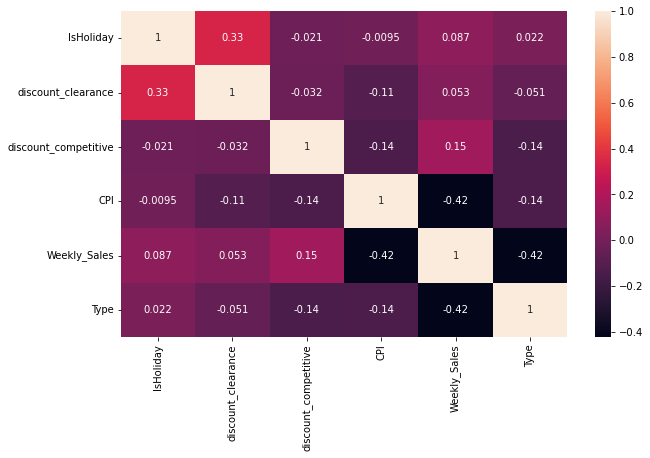

In [18]:
plt.figure(figsize = (10,6)) 
sns.heatmap(corr, annot = True)

In [19]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV 
from sklearn.linear_model import LogisticRegression 
from sklearn import metrics 
from sklearn.preprocessing import MinMaxScaler

X = processed_data.drop(['CPI'], axis = 1) 
y = processed_data[['CPI']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42) 
scaler = MinMaxScaler() 
X_train = scaler.fit_transform(X_train) 
X_test = scaler.transform(X_test)

In [20]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS 

# Sequential Forward Selection(sfs) 
sfs = SFS(LogisticRegression(),
          k_features='best', 
          forward=True, 
          floating=False, 
          scoring = 'accuracy', 
          cv = 0
         )

In [21]:
from sklearn import preprocessing
from sklearn import utils

lab_enc = preprocessing.LabelEncoder()
y_transformed = lab_enc.fit_transform(y)

C:\Users\santo\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [22]:
sfs.fit(X, y_transformed)
sfs.k_feature_names_

C:\Users\santo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\santo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

('IsHoliday',
 'discount_clearance',
 'discount_competitive',
 'Weekly_Sales',
 'Type')

C:\Users\santo\anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\santo\anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


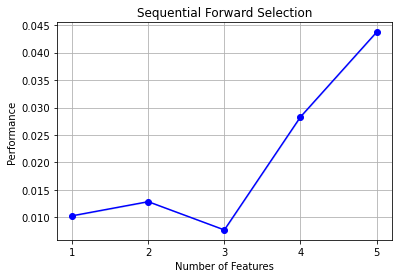

In [23]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev')
plt.title('Sequential Forward Selection')
plt.grid()
plt.show()